In [1]:
# Get thinkdsp.py

import os

if not os.path.exists('thinkdsp_2.py'):
    !wget https://github.com/AllenDowney/ThinkDSP/raw/master/code/thinkdsp.py

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from thinkdsp_2 import decorate

In [4]:
def read_wave(filename="sound.wav"):
    """Reads a wave file.

    filename: string

    returns: Wave
    """
    fp = open_wave(filename, "r")

    nchannels = fp.getnchannels()
    nframes = fp.getnframes()
    sampwidth = fp.getsampwidth()
    framerate = fp.getframerate()

    z_str = fp.readframes(nframes)

    fp.close()

    dtype_map = {1: np.int8, 2: np.int16, 3: "special", 4: np.int32}
    if sampwidth not in dtype_map:
        raise ValueError("sampwidth %d unknown" % sampwidth)

    if sampwidth == 3:
        xs = np.fromstring(z_str, dtype=np.int8).astype(np.int32)
        ys = (xs[2::3] * 256 + xs[1::3]) * 256 + xs[0::3]
    else:
        ys = np.fromstring(z_str, dtype=dtype_map[sampwidth])

    # if it's in stereo, just pull out the first channel
    if nchannels == 2:
        ys = ys[::2]

    # ts = np.arange(len(ys)) / framerate
    wave = Wave(ys, framerate=framerate)
    wave.normalize()
    return wave

# read_wave reads .wav files
Test test

In [3]:
if not os.path.exists('92002__jcveliz__violin-origional.wav'):
    !wget https://github.com/AllenDowney/ThinkDSP/raw/master/code/92002__jcveliz__violin-origional.wav

In [2]:
from thinkdsp_2 import read_wave

wave = read_wave('sna16.wav')

In [3]:
def plot_spectrogram(wave, seg_length):
    """
    """
    spectrogram = wave.make_spectrogram(seg_length)
    print('Time resolution (s)', spectrogram.time_res)
    print('Frequency resolution (Hz)', spectrogram.freq_res)
    spectrogram.plot(high=700)
    decorate(xlabel='Time(s)', ylabel='Frequency (Hz)')

In [4]:
segment=wave.segment(start=0,duration=110)

In [5]:
segment.make_audio()

Time resolution (s) 0.5
Frequency resolution (Hz) 2.0


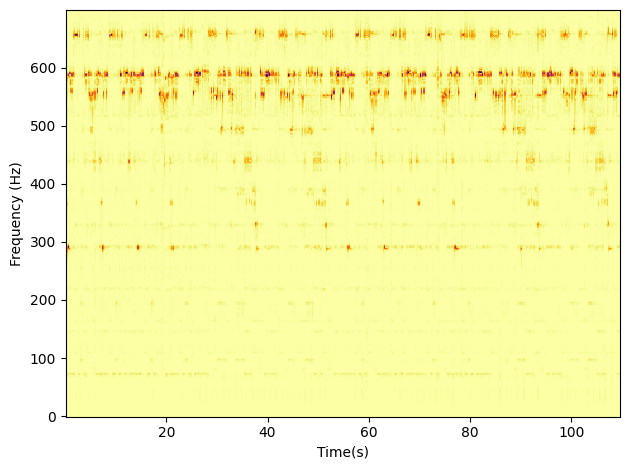

In [8]:
plot_spectrogram(segment, 22050)

In [9]:
spectrogram=segment.make_spectrogram_2(44100)

In [10]:
print(spectrogram.shape)
#a=abs(spectrogram)
#real=spectrogram.real
#imag=spectrogram.imag
#a=np.hstack((real,imag))

(218, 22051)


In [11]:
#Generate Random Permutation Matrix
N=spectrogram.shape[1]
N0=spectrogram.shape[0]
print(N)
#I=np.identity(N)
#P=np.matrix(I[np.random.permutation(np.arange(N)),:])
P=np.random.permutation(N)
P2=P[P]

22051


In [12]:
#Computing Tri-Gram
#S=np.matrix(spectrogram)
S=spectrogram
trigram=np.zeros((S.shape[0]-2,S.shape[1]),dtype=complex)
bispectrum=np.zeros((S.shape[0],S.shape[1]-1),dtype=complex)

In [13]:
for i in range(0,spectrogram.shape[0]-2):
    #trigram[i,:]=S[i,:]*P*P+S[i+1,:]*P+S[i+2,:]
    trigram[i,:]=S[i,:][P2]+S[i+1,:][P]+S[i+2,:]

In [14]:
Nc=round(trigram.shape[0]/5)
print(Nc)
combined=np.zeros((Nc,trigram.shape[1]),dtype=complex)
for j in range(0,Nc-1):
    combined[j,:]=trigram[5*j,:]+trigram[5*j+1,:]+trigram[5*j+2,:]+trigram[5*j+3,:]+trigram[5*j+4,:]

43


In [15]:
#Compute Bispectrum
for k in range(0,N0):
    bispectrum[k,:] = S[k,0:N-1]*S[k,1:N]*np.conj(np.concatenate((S[k,1::2],S[k,(N-1)%2:N-2:2])))

In [16]:
#Sliding Average
Ns=10 #Number of slices to be averaged
SA=np.zeros((N0-Ns+1,bispectrum.shape[1]),dtype=complex)
for i in range(0,N0-Ns):
    for j in range(0,Ns-1):
        SA[i,:]+=bispectrum[i+j,:]

In [17]:
test=abs(SA)
#real=trigram.real
#imag=trigram.imag
#test=np.hstack((real,imag))

In [18]:
from sklearn.manifold import TSNE
tsne_em = TSNE(n_components=2, perplexity=6, n_iter=1000, verbose=1).fit_transform(test)

[t-SNE] Computing 19 nearest neighbors...
[t-SNE] Indexed 209 samples in 0.004s...
[t-SNE] Computed neighbors for 209 samples in 0.095s...
[t-SNE] Computed conditional probabilities for sample 209 / 209
[t-SNE] Mean sigma: 554371700.374677
[t-SNE] KL divergence after 250 iterations with early exaggeration: 55.696426
[t-SNE] KL divergence after 1000 iterations: 0.203035


In [21]:
from bioinfokit.visuz import cluster
cluster.tsneplot(score=tsne_em)

In [22]:
pip uninstall bioinfokit

Found existing installation: bioinfokit 2.1.3
Uninstalling bioinfokit-2.1.3:
  Would remove:
    /Users/pchuang/miniforge3/lib/python3.10/site-packages/bioinfokit-2.1.3.dist-info/*
    /Users/pchuang/miniforge3/lib/python3.10/site-packages/bioinfokit/*
Proceed (Y/n)? ^C
ERROR: Operation cancelled by user
Note: you may need to restart the kernel to use updated packages.


In [ ]:
Y